# Testes de normalidade

In [48]:
import pandas as pd
import numpy as np

In [49]:
enem_sp = pd.read_csv('data/enem_2019-tratado.csv', sep=',', encoding='iso-8859-1') 

In [50]:
enem_sp

,NU_INSCRICAO,NO_MUNICIPIO_RESIDENCIA,IDADE,SEXO,TP_ESTADO_CIVIL,RACA,TP_NACIONALIDADE,TP_ST_CONCLUSAO,ESCOLA,CO_ESCOLA,...,NOTA_MT,TP_LINGUA,TP_STATUS_REDACAO,COMP1,COMP2,COMP3,COMP4,COMP5,NOTA_REDACAO,INTERNET
0,"1,90E+11",Santa Isabel,22,M,1,parda,1,1,nao_respondeu,NaN,...,600.2,ingles,1.0,160.0,200.0,180.0,200.0,200.0,940.0,sim
1,"1,90E+11",São Paulo,17,F,1,parda,1,2,privada,15567761.0,...,731.8,ingles,1.0,160.0,120.0,200.0,200.0,200.0,880.0,nao
2,"1,90E+11",São Bernardo do Campo,19,M,1,parda,1,2,publica,35904958.0,...,393.2,1,1.0,80.0,160.0,120.0,100.0,100.0,560.0,sim
3,"1,90E+11",Embu-Guaçu,17,F,1,parda,1,2,publica,NaN,...,419.2,ingles,1.0,120.0,120.0,120.0,120.0,80.0,560.0,sim
4,"1,90E+11",Guarulhos,23,F,1,branca,1,1,nao_respondeu,NaN,...,796.1,ingles,1.0,160.0,200.0,180.0,180.0,160.0,880.0,sim
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499935,"1,90E+11",São Paulo,18,F,1,parda,1,1,nao_respondeu,NaN,...,479.1,1,1.0,100.0,120.0,120.0,140.0,100.0,580.0,sim
499936,"1,90E+11",São Paulo,17,F,1,preta,1,2,publica,35925457.0,...,43.2,1,1.0,80.0,120.0,140.0,120.0,100.0,560.0,sim
499937,"1,90E+11",São Paulo,17,F,1,parda,1,2,publica,35001156.0,...,487.3,ingles,1.0,120.0,80.0,60.0,120.0,0.0,380.0,sim
499938,"1,90E+11",São Paulo,17,M,1,parda,1,2,publica,NaN,...,401.1,ingles,1.0,160.0,120.0,160.0,140.0,160.0,740.0,nao


In [51]:
enem_osasco = enem_sp.loc[enem_sp.NO_MUNICIPIO_RESIDENCIA == 'Osasco']

In [52]:
enem_tupa = enem_sp.loc[enem_sp.NO_MUNICIPIO_RESIDENCIA == 'Tupã']

In [53]:
enem_tupa.shape

(524, 28)

In [54]:
enem_osasco.shape

(9521, 28)

## Histograma

In [55]:
import plotly.express as px
grafico = px.histogram (enem_sp, x = 'NOTA_REDACAO', nbins = 40, histnorm='percent',)
grafico.update_layout(width=500, height=400, title_text='Distribuição de notas de Redação')
grafico.show()

In [56]:
import plotly.express as px
grafico = px.histogram (enem_osasco, x = 'NOTA_REDACAO', nbins = 40, histnorm='percent',)
grafico.update_layout(width=500, height=400, title_text='Distribuição de notas de Redação em Osasco')
grafico.show()

In [57]:
import plotly.express as px
grafico = px.histogram (enem_tupa, x = 'NOTA_REDACAO', nbins = 40, histnorm='percent',)
grafico.update_layout(width=500, height=400, title_text='Distribuição de notas de Redação em Osasco')
grafico.show()

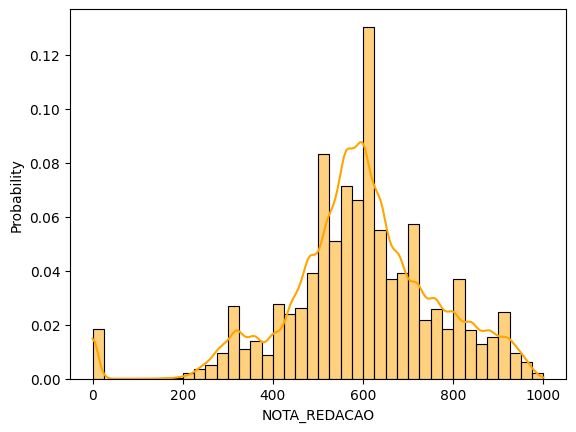

In [58]:
import seaborn as sns
sns.histplot(enem_sp, x='NOTA_REDACAO', bins=40, color='orange', kde=True,stat='probability');

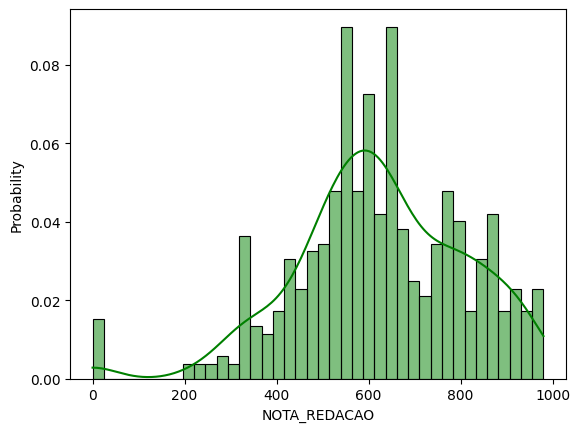

In [59]:
sns.histplot(enem_tupa, x='NOTA_REDACAO', bins=40, color='green', kde=True,stat='probability');

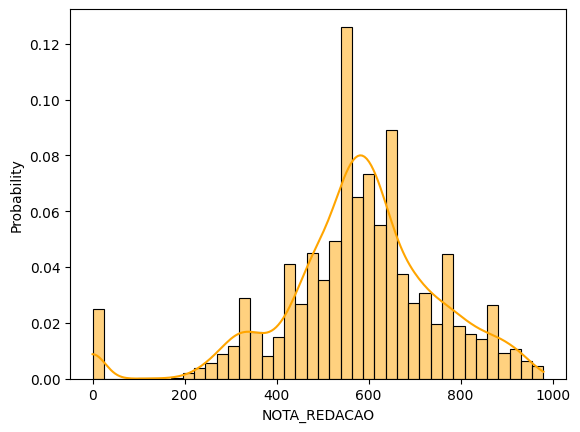

In [60]:
sns.histplot(enem_osasco, x='NOTA_REDACAO', bins=40, color='orange', kde=True,stat='probability');

## QQplot

In [61]:
import scipy.stats as stats
import matplotlib.pyplot as plt

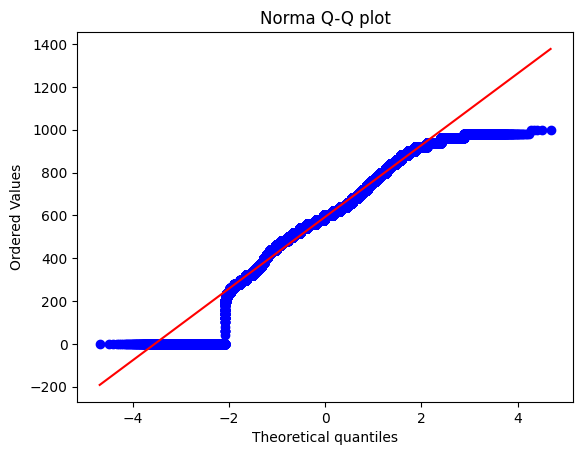

In [62]:
stats.probplot(enem_sp['NOTA_REDACAO'], dist='norm', plot=plt)
plt.title('Normal Q-Q plot')
plt.show()
# Maior precisão para verificar a normalidade

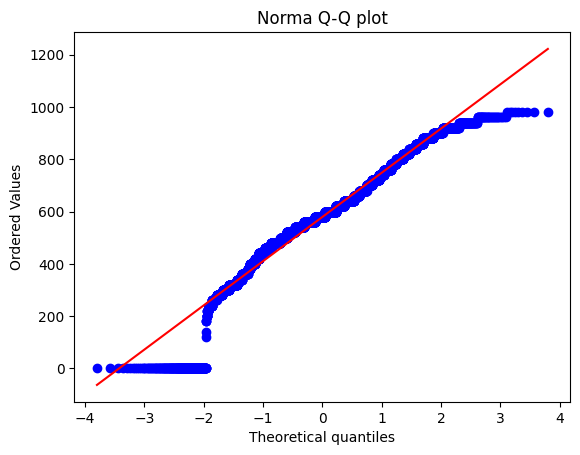

In [63]:
stats.probplot(enem_osasco['NOTA_REDACAO'], dist='norm', plot=plt)
plt.title('Norma Q-Q plot')
plt.show()

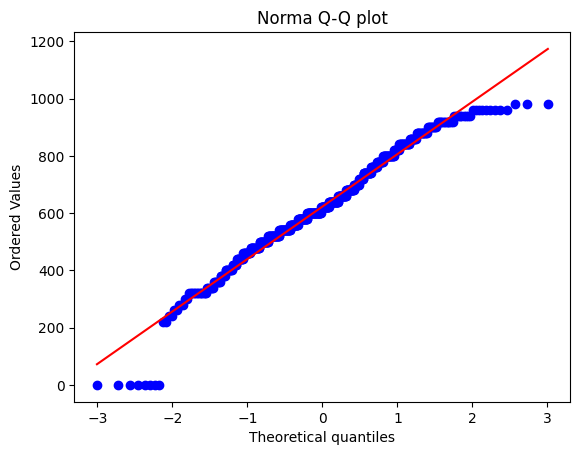

In [64]:
stats.probplot(enem_tupa['NOTA_REDACAO'], dist='norm', plot=plt)
plt.title('Norma Q-Q plot')
plt.show()

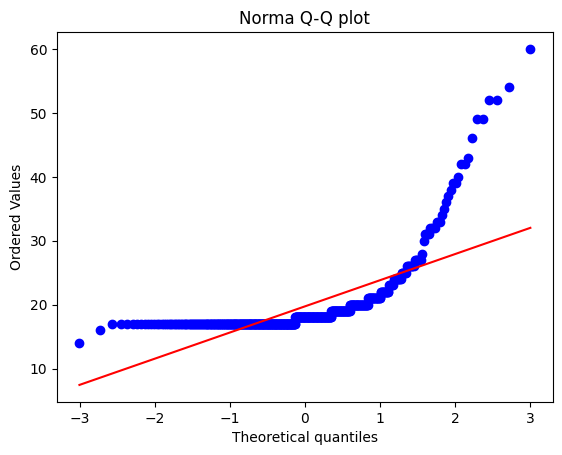

In [65]:
stats.probplot(enem_tupa['IDADE'], dist='norm', plot=plt)
plt.title('Norma Q-Q plot')
plt.show()

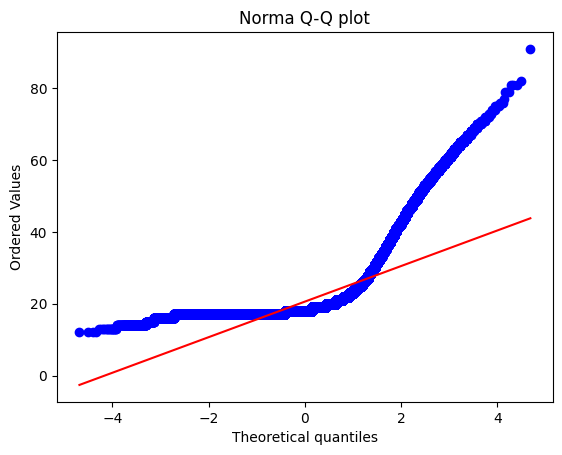

In [66]:
stats.probplot(enem_sp['IDADE'], dist='norm', plot=plt)
plt.title('Norma Q-Q plot')
plt.show()

## Teste de Shapiro-Wilk

critérios:
nível de significância de 0.05% ou 5%(mais utilizado)
quando p > 0.05(distribuição normal)

In [67]:
stats.shapiro(enem_sp.NOTA_REDACAO)
# p-value may not be accurate for N > 5000.

/home/bernardo/.local/lib/python3.8/site-packages/scipy/stats/_morestats.py:1800: UserWarning:

p-value may not be accurate for N > 5000.



ShapiroResult(statistic=0.9633597135543823, pvalue=0.0)

In [68]:
stats.shapiro(enem_tupa.NOTA_REDACAO)
# O primeiro número é a estatística de teste

ShapiroResult(statistic=0.9733083248138428, pvalue=3.541695647868437e-08)

In [69]:
p_valor = stats.shapiro(enem_tupa.NOTA_REDACAO)[1]
print(p_valor)
print('A distribuição não é normal da nota de redação do enem em Tupã')

3.541695647868437e-08
A distribuição não é normal da nota de redação do enem em Tupã


In [70]:
p_valor = stats.shapiro(enem_osasco.NOTA_REDACAO)
print(p_valor)
print('Também não é uma distribuição normal')

ShapiroResult(statistic=0.9542011022567749, pvalue=0.0)
Também não é uma distribuição normal


## Teste Lilliefors (Kolmogorov-Smirnov)

In [71]:
import statsmodels
from statsmodels.stats.diagnostic import lilliefors

O primeiro valor é a estatística de teste e o segundo é o p-valor

In [72]:
statsmodels.stats.diagnostic.lilliefors(enem_tupa.NOTA_REDACAO, dist='norm')

(0.053966451207192984, 0.0020401155999012818)

In [73]:
statsmodels.stats.diagnostic.lilliefors(enem_osasco.NOTA_REDACAO, dist='norm')

(0.09016609773650813, 0.0009999999999998899)

In [74]:
statsmodels.stats.diagnostic.lilliefors(enem_sp.NOTA_REDACAO, dist='norm')

(0.0831243667968013, 0.0009999999999998899)